# 🥗 Multi-Ingredient Food Image Classification and Context-Aware Recipe Recommendation
### Dhanush Biligiri N H, Fnu Sowrabh, Ram Bagaria, Akhilesh Dandavati

This notebook demonstrates the complete pipeline for detecting multiple ingredients using YOLOv8 and recommending recipes using a hybrid recommendation system (TF-IDF + planned collaborative filtering).

---

## 📦 Install & Import Required Libraries
Install required libraries and import modules for image processing, machine learning, and the interface.

In [1]:
import pandas as pd
import os
from ultralytics import YOLO
import torch
import torchvision
from pathlib import Path
from collections import defaultdict
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from PIL import Image
from skimage import io
import gradio as gr
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import optuna
import json
from torchvision.ops import nms
import random
from glob import glob

/home/dnarsipu/anaconda3/envs/yolo/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:

print(torch.__version__)
print(torchvision.__version__)


2.6.0+cu124
0.21.0+cu124


## 📁 Dataset Overview
We use a custom dataset with images annotated for 36 ingredient classes.
This section shows a summary of the dataset structure and sample labels.

In [3]:
def count_files(folder_path):
    image_extensions = ('.jpg','.txt')
    image_count = 0
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(image_extensions):
            image_count += 1
    return image_count



In [4]:
folder_path = 'Dataset/FOOD_INGREDIENTS_DETECTION36/train/images' 
num_images = count_files(folder_path)
print(f'Number of images in the folder: {num_images}')

Number of images in the folder: 1425


In [5]:
folder_path = 'Dataset/FOOD_INGREDIENTS_DETECTION36/valid/images' 
num_labels = count_files(folder_path)
print(f'Number of labels in the folder: {num_labels}')

Number of labels in the folder: 286


In [6]:
folder_path = 'Dataset/FOOD_INGREDIENTS_DETECTION36/test/images' 
num_labels = count_files(folder_path)
print(f'Number of labels in the folder: {num_labels}')

Number of labels in the folder: 190


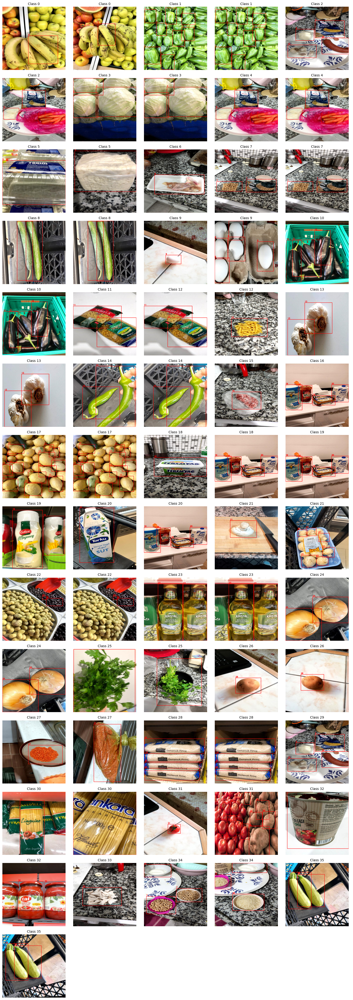

In [7]:
# ################# Check how the test dataset looks #################

# Define dataset paths
image_folder = "Dataset/FOOD_INGREDIENTS_DETECTION36/test/images/"  # Path to images
label_folder = "Dataset/FOOD_INGREDIENTS_DETECTION36/test/labels/"  # Path to YOLO labels

# Dictionary to store up to two unique examples per class
class_examples = defaultdict(list)
class_file_map = {}

# Get list of label files
label_files = [f for f in os.listdir(label_folder) if f.endswith(".txt")]

# Find two unique images per class
for label_file in label_files:
    label_path = os.path.join(label_folder, label_file)

    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        label = line.strip().split()
        if len(label) < 5: 
            continue

        class_id = int(label[0])

        # Convert label filename to image filename
        image_file_jpg = label_file.replace(".txt", ".jpg")
        image_file_png = label_file.replace(".txt", ".png")

        # Check if the image exists
        if os.path.exists(os.path.join(image_folder, image_file_jpg)):
            image_file = image_file_jpg
        elif os.path.exists(os.path.join(image_folder, image_file_png)):
            image_file = image_file_png
        else:
            continue  # Skip if image not found

        # Store up to 2 unique images per class 
        if len(class_examples[class_id]) < 2:
            class_examples[class_id].append(image_file)

        # Store only one label file per class
        if class_id not in class_file_map:
            class_file_map[class_id] = label_file

# Sort class_examples dictionary by class ID
class_examples = dict(sorted(class_examples.items()))

# Function to draw bounding boxes with class numbers
def draw_yolo_bboxes(image_path, label_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Could not read image {image_path}")
        return None

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image.shape

    # Read label file if it exists
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            label = line.strip().split()
            if len(label) < 5:
                continue

            try:
                class_id = int(label[0])
                x_center, y_center, bbox_width, bbox_height = map(float, label[1:5])
            except ValueError:
                print(f"Skipping invalid label format in {label_path}: {line}")
                continue

            # Convert YOLO to pixel coords
            x1 = int((x_center - bbox_width / 2) * w)
            y1 = int((y_center - bbox_height / 2) * h)
            x2 = int((x_center + bbox_width / 2) * w)
            y2 = int((y_center + bbox_height / 2) * h)

            # Clamp within image bounds
            x1, y1, x2, y2 = max(0, x1), max(0, y1), min(w, x2), min(h, y2)

            # Draw box and class ID
            color = (255, 0, 0)  # Blue
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, str(class_id), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    return image

# Calculate number of images to display
total_images = sum(len(images) for images in class_examples.values())
cols = 5
rows = (total_images + cols - 1) // cols  # Ceiling division

# Create grid
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()

# Display each image
i = 0
for class_id, image_files in class_examples.items():
    for image_file in list(image_files)[:2]:
        img_path = os.path.join(image_folder, image_file)
        label_path = os.path.join(label_folder, image_file.replace(".jpg", ".txt").replace(".png", ".txt"))
        img_with_bboxes = draw_yolo_bboxes(img_path, label_path)

        if img_with_bboxes is not None:
            axes[i].imshow(img_with_bboxes)
            axes[i].set_title(f"Class {class_id}", fontsize=10)
            axes[i].axis("off")
            i += 1

# Hide extra subplots
for j in range(i, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


## 🚀 Training YOLOv8 with Hyperparameter Optimization (Optuna)
We optimize epochs, learning rate, batch size, and optimizer using Bayesian Optimization.

In [8]:
import optuna
from ultralytics import YOLO
import torch
import gc

def objective(trial):
    # Suggest hyperparameters
    epochs = trial.suggest_int("epochs", 5, 50)
    lr0 = trial.suggest_float("lr0", 1e-5, 1e-2, log=True)
    batch = trial.suggest_categorical("batch", [16, 32])
    optimizer = trial.suggest_categorical("optimizer", ["SGD", "Adam", "AdamW"])

    # Free up memory
    torch.cuda.empty_cache()
    gc.collect()

    try:
        model = YOLO("yolov8n.pt")  # lightweight to avoid OOM
        results = model.train(
            data="Dataset/FOOD_INGREDIENTS_DETECTION36/data.yaml",
            epochs=epochs,
            lr0=lr0,
            batch=batch,
            optimizer=optimizer,
            project="optuna_trials",
            name=f"trial_{trial.number}",
            verbose=False,
            amp=False  # AMP off for stability
        )

        # Safely get mAP@50
        map50 = results.results_dict.get("metrics/mAP50(B)")
        if map50 is None:
            raise RuntimeError("mAP50(B) not found.")
        return map50

    except RuntimeError as e:
        if "out of memory" in str(e).lower() or "invalid argument" in str(e).lower():
            print(f"[PRUNE] Trial {trial.number} failed: {e}")
            torch.cuda.empty_cache()
            gc.collect()
            raise optuna.exceptions.TrialPruned()
        else:
            raise

# Bayesian Optimization
sampler = optuna.samplers.TPESampler()
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=3)

print("Best trial:")
print(study.best_trial)


[I 2025-04-10 02:07:41,635] A new study created in memory with name: no-name-e6b881b4-80be-4954-9247-09551ca4cefd


New https://pypi.org/project/ultralytics/8.3.105 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.82 🚀 Python-3.10.16 torch-2.6.0+cu124 CUDA:0 (NVIDIA RTX A2000 12GB, 11926MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/data.yaml, epochs=13, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=optuna_trials, name=trial_0, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augme

train: Scanning /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/train/labels.cache... 1425 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1425/1425 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 14, len(boxes) = 3542. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/valid/labels.cache... 286 images, 0 backgrounds, 0 corrupt: 100%|██████████| 286/286 [00:00<?, ?it/s]


Plotting labels to optuna_trials/trial_0/labels.jpg... 
optimizer: AdamW(lr=3.401938300737884e-05, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to optuna_trials/trial_0
Starting training for 13 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/13      8.04G      1.191       3.94      1.368         81        640: 100%|██████████| 45/45 [00:15<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]


                   all        286        728   0.000495      0.102    0.00705    0.00426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/13      7.86G      1.156      3.471      1.328         65        640: 100%|██████████| 45/45 [00:14<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]


                   all        286        728     0.0176      0.276     0.0358     0.0236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/13      7.92G      1.128      3.341      1.324         77        640: 100%|██████████| 45/45 [00:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]


                   all        286        728      0.604     0.0636     0.0959     0.0638
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/13      7.91G      1.059      3.285       1.36         48        640: 100%|██████████| 45/45 [00:15<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.97it/s]


                   all        286        728       0.63      0.135      0.122     0.0825

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/13      7.85G      1.037      3.192      1.353         40        640: 100%|██████████| 45/45 [00:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

                   all        286        728      0.645      0.169      0.141     0.0986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/13      7.86G      1.023      3.119      1.345         30        640: 100%|██████████| 45/45 [00:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

                   all        286        728      0.708      0.171      0.164      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/13      7.86G      1.032      3.024      1.324         56        640: 100%|██████████| 45/45 [00:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

                   all        286        728      0.679       0.19      0.177      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/13      7.84G      1.011      2.986      1.309         38        640: 100%|██████████| 45/45 [00:15<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.93it/s]


                   all        286        728      0.658      0.204      0.189      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/13      7.84G      0.999       2.95      1.315         60        640: 100%|██████████| 45/45 [00:15<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.94it/s]


                   all        286        728       0.66      0.201      0.202      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/13      7.87G     0.9903      2.904      1.301         29        640: 100%|██████████| 45/45 [00:15<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

                   all        286        728      0.658      0.202      0.213      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/13      7.93G     0.9839      2.859      1.284         31        640: 100%|██████████| 45/45 [00:15<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.94it/s]


                   all        286        728      0.715      0.198      0.223      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/13      7.92G      0.982      2.853      1.286         32        640: 100%|██████████| 45/45 [00:15<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.94it/s]


                   all        286        728       0.72      0.199       0.23      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/13      7.85G     0.9806      2.846      1.288         30        640: 100%|██████████| 45/45 [00:15<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

                   all        286        728       0.72      0.203      0.231      0.169



13 epochs completed in 0.063 hours.
Optimizer stripped from optuna_trials/trial_0/weights/last.pt, 6.3MB
Optimizer stripped from optuna_trials/trial_0/weights/best.pt, 6.3MB

Validating optuna_trials/trial_0/weights/best.pt...
Ultralytics 8.3.82 🚀 Python-3.10.16 torch-2.6.0+cu124 CUDA:0 (NVIDIA RTX A2000 12GB, 11926MiB)
Model summary (fused): 72 layers, 3,012,668 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]


                   all        286        728      0.722      0.202      0.233      0.171
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to optuna_trials/trial_0


[I 2025-04-10 02:11:35,294] Trial 0 finished with value: 0.23306525491580316 and parameters: {'epochs': 13, 'lr0': 3.401938300737884e-05, 'batch': 32, 'optimizer': 'AdamW'}. Best is trial 0 with value: 0.23306525491580316.


New https://pypi.org/project/ultralytics/8.3.105 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.82 🚀 Python-3.10.16 torch-2.6.0+cu124 CUDA:0 (NVIDIA RTX A2000 12GB, 11926MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/data.yaml, epochs=11, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=optuna_trials, name=trial_1, exist_ok=False, pretrained=True, optimizer=Adam, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augmen

train: Scanning /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/train/labels.cache... 1425 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1425/1425 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 14, len(boxes) = 3542. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/valid/labels.cache... 286 images, 0 backgrounds, 0 corrupt: 100%|██████████| 286/286 [00:00<?, ?it/s]


Plotting labels to optuna_trials/trial_1/labels.jpg... 
optimizer: Adam(lr=0.00034610907228708934, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to optuna_trials/trial_1
Starting training for 11 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/11      4.04G      1.234      3.756      1.416          7        640: 100%|██████████| 90/90 [00:16<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.89it/s]

                   all        286        728     0.0387      0.171     0.0442     0.0233


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/11      4.01G      1.163      3.183       1.49          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.19it/s]

                   all        286        728      0.552       0.22      0.135     0.0936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/11      3.97G      1.111      2.841      1.449          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.23it/s]

                   all        286        728      0.629       0.22      0.175       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/11      4.04G      1.102      2.599      1.427          9        640: 100%|██████████| 90/90 [00:15<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.29it/s]

                   all        286        728      0.457      0.296      0.236      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/11      3.99G       1.08      2.375      1.412          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.29it/s]

                   all        286        728      0.576      0.301      0.278      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/11      4.02G      1.036      2.179      1.358          5        640: 100%|██████████| 90/90 [00:15<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.25it/s]

                   all        286        728      0.522      0.381      0.352      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/11      4.01G      1.046      2.056      1.372          3        640: 100%|██████████| 90/90 [00:15<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.30it/s]

                   all        286        728      0.442      0.381      0.406      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/11      3.98G      1.016      1.896       1.35          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.31it/s]

                   all        286        728      0.539      0.401      0.444      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/11      3.99G     0.9831      1.815      1.321          6        640: 100%|██████████| 90/90 [00:15<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.30it/s]

                   all        286        728       0.49      0.468      0.467      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/11      4.02G     0.9692      1.745      1.313          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.31it/s]

                   all        286        728      0.523      0.549      0.511      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/11      4.02G     0.9434      1.649      1.283          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.32it/s]

                   all        286        728       0.65       0.47      0.513      0.385



11 epochs completed in 0.054 hours.
Optimizer stripped from optuna_trials/trial_1/weights/last.pt, 6.3MB
Optimizer stripped from optuna_trials/trial_1/weights/best.pt, 6.3MB

Validating optuna_trials/trial_1/weights/best.pt...
Ultralytics 8.3.82 🚀 Python-3.10.16 torch-2.6.0+cu124 CUDA:0 (NVIDIA RTX A2000 12GB, 11926MiB)
Model summary (fused): 72 layers, 3,012,668 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.48it/s]


                   all        286        728      0.651       0.47      0.513      0.385
Speed: 0.2ms preprocess, 3.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to optuna_trials/trial_1


[I 2025-04-10 02:14:56,659] Trial 1 finished with value: 0.5125286245517918 and parameters: {'epochs': 11, 'lr0': 0.00034610907228708934, 'batch': 16, 'optimizer': 'Adam'}. Best is trial 1 with value: 0.5125286245517918.


New https://pypi.org/project/ultralytics/8.3.105 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.82 🚀 Python-3.10.16 torch-2.6.0+cu124 CUDA:0 (NVIDIA RTX A2000 12GB, 11926MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=optuna_trials, name=trial_2, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augme

train: Scanning /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/train/labels.cache... 1425 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1425/1425 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 14, len(boxes) = 3542. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/valid/labels.cache... 286 images, 0 backgrounds, 0 corrupt: 100%|██████████| 286/286 [00:00<?, ?it/s]


Plotting labels to optuna_trials/trial_2/labels.jpg... 
optimizer: AdamW(lr=0.00048764194621946625, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to optuna_trials/trial_2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.04G      1.229      3.718      1.417          7        640: 100%|██████████| 90/90 [00:16<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.89it/s]


                   all        286        728     0.0186      0.356     0.0484     0.0314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.03G      1.241      3.121       1.41          6        640: 100%|██████████| 90/90 [00:15<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.00it/s]


                   all        286        728      0.558      0.206      0.128     0.0844

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         4G      1.191      2.672      1.386          6        640: 100%|██████████| 90/90 [00:15<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.00it/s]


                   all        286        728      0.542      0.229      0.155      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         4G      1.202      2.493      1.401          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.15it/s]

                   all        286        728      0.336      0.299      0.234      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.02G       1.18      2.308      1.375          9        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.12it/s]

                   all        286        728      0.508      0.355      0.294      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.02G      1.169      2.113      1.369          3        640: 100%|██████████| 90/90 [00:15<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.27it/s]

                   all        286        728        0.6      0.346      0.351      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.04G      1.138      1.988      1.357          6        640: 100%|██████████| 90/90 [00:15<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.22it/s]

                   all        286        728       0.44      0.418      0.344      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.02G      1.131      1.912       1.36          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.25it/s]

                   all        286        728      0.657      0.368      0.494      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.01G      1.119      1.813      1.336         10        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.30it/s]

                   all        286        728      0.481      0.489      0.496      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         4G      1.098      1.693      1.321          5        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.32it/s]

                   all        286        728      0.635      0.418        0.5       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.01G      1.076      1.612      1.298          4        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.35it/s]

                   all        286        728      0.621      0.479      0.502      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.05G      1.099      1.631      1.317          3        640: 100%|██████████| 90/90 [00:15<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.33it/s]

                   all        286        728       0.55      0.519      0.559      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.01G      1.089      1.562      1.311          6        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.30it/s]

                   all        286        728      0.701      0.526      0.587      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.02G      1.072      1.529      1.297          5        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.31it/s]

                   all        286        728      0.482      0.572      0.583      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.03G      1.066      1.472      1.306          7        640: 100%|██████████| 90/90 [00:15<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.31it/s]

                   all        286        728      0.452      0.639      0.607      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.04G      1.072      1.442      1.307          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.33it/s]

                   all        286        728      0.684      0.511      0.638      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.04G      1.045      1.407      1.292          7        640: 100%|██████████| 90/90 [00:15<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.35it/s]

                   all        286        728      0.604      0.648      0.664      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         4G      1.046      1.338      1.292          4        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.35it/s]

                   all        286        728       0.66      0.594      0.628      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.03G      1.041      1.369       1.29          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.35it/s]

                   all        286        728       0.57      0.671      0.691      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.02G      1.018      1.311      1.269          3        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.33it/s]

                   all        286        728      0.582      0.621      0.642      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.01G      1.015      1.267      1.276          4        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.36it/s]

                   all        286        728      0.644      0.638      0.672       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.02G      1.004      1.256      1.248          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.35it/s]

                   all        286        728      0.663      0.631      0.675      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.04G      1.012      1.259       1.27         11        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.33it/s]

                   all        286        728      0.682      0.553      0.624      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.02G     0.9884      1.177      1.255          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.36it/s]

                   all        286        728      0.598      0.655      0.686      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.99G     0.9815      1.158      1.244         10        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.35it/s]

                   all        286        728      0.596      0.749      0.726      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.02G     0.9681      1.148      1.232          3        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.716      0.596      0.686       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.02G     0.9632      1.175      1.226          8        640: 100%|██████████| 90/90 [00:15<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.36it/s]

                   all        286        728      0.673      0.709      0.725      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         4G     0.9591      1.119       1.23          4        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.36it/s]

                   all        286        728      0.682      0.649      0.702      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.01G     0.9588      1.115      1.229          4        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.38it/s]

                   all        286        728       0.83      0.647       0.77      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.05G     0.9383      1.071      1.215          5        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.38it/s]

                   all        286        728      0.676      0.704      0.721      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.04G     0.9539      1.091      1.229          3        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.654      0.738      0.748      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.02G     0.9265      1.054      1.219          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.644      0.704      0.728      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.04G     0.9373      1.037      1.221          7        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.624       0.71      0.736      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.03G     0.9357      1.018      1.205          5        640: 100%|██████████| 90/90 [00:15<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.709      0.691      0.749      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.03G     0.9212      1.041      1.211          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.561      0.723      0.735      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         4G     0.9266      1.008      1.206          3        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.677      0.691      0.751      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.01G     0.9047     0.9837      1.199          4        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.738      0.636      0.733      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.04G     0.9186     0.9688        1.2          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.36it/s]

                   all        286        728      0.688      0.716      0.759      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.99G     0.9096     0.9944      1.197         10        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.37it/s]

                   all        286        728      0.706      0.726       0.77      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         4G     0.8962     0.9791      1.194         12        640: 100%|██████████| 90/90 [00:15<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.39it/s]

                   all        286        728      0.709      0.702      0.772      0.577


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.01G     0.8297       0.89      1.204          2        640: 100%|██████████| 90/90 [00:15<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.38it/s]

                   all        286        728      0.707       0.74      0.758      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.99G     0.8037     0.8327       1.18          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.36it/s]

                   all        286        728      0.693      0.735      0.786      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.01G       0.82     0.8565      1.192          5        640: 100%|██████████| 90/90 [00:15<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.38it/s]

                   all        286        728      0.748      0.712      0.783      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         4G     0.7927     0.7944      1.171          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.38it/s]

                   all        286        728       0.79        0.7      0.801      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.01G     0.8047     0.8332      1.175          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.39it/s]

                   all        286        728      0.725      0.744       0.79      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.03G     0.7809     0.8167      1.166         13        640: 100%|██████████| 90/90 [00:15<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.38it/s]

                   all        286        728      0.677      0.749      0.782      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.04G     0.7678     0.7608      1.151         10        640: 100%|██████████| 90/90 [00:15<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.39it/s]

                   all        286        728      0.725       0.73      0.793      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.03G     0.7611     0.7269      1.141          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.38it/s]

                   all        286        728      0.707      0.753      0.795      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.99G     0.7712     0.7441      1.147          1        640: 100%|██████████| 90/90 [00:15<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.40it/s]

                   all        286        728      0.739      0.734      0.799      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.98G     0.7744      0.757       1.15          7        640: 100%|██████████| 90/90 [00:15<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  6.39it/s]

                   all        286        728      0.766      0.733      0.796      0.596



50 epochs completed in 0.246 hours.
Optimizer stripped from optuna_trials/trial_2/weights/last.pt, 6.3MB
Optimizer stripped from optuna_trials/trial_2/weights/best.pt, 6.3MB

Validating optuna_trials/trial_2/weights/best.pt...
Ultralytics 8.3.82 🚀 Python-3.10.16 torch-2.6.0+cu124 CUDA:0 (NVIDIA RTX A2000 12GB, 11926MiB)
Model summary (fused): 72 layers, 3,012,668 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.53it/s]


                   all        286        728      0.737      0.733      0.799      0.598
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to optuna_trials/trial_2


[I 2025-04-10 02:29:49,601] Trial 2 finished with value: 0.799016491834772 and parameters: {'epochs': 50, 'lr0': 0.00048764194621946625, 'batch': 16, 'optimizer': 'AdamW'}. Best is trial 2 with value: 0.799016491834772.


Best trial:
FrozenTrial(number=2, state=TrialState.COMPLETE, values=[0.799016491834772], datetime_start=datetime.datetime(2025, 4, 10, 2, 14, 56, 660602), datetime_complete=datetime.datetime(2025, 4, 10, 2, 29, 49, 601329), params={'epochs': 50, 'lr0': 0.00048764194621946625, 'batch': 16, 'optimizer': 'AdamW'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'epochs': IntDistribution(high=50, log=False, low=5, step=1), 'lr0': FloatDistribution(high=0.01, log=True, low=1e-05, step=None), 'batch': CategoricalDistribution(choices=(16, 32)), 'optimizer': CategoricalDistribution(choices=('SGD', 'Adam', 'AdamW'))}, trial_id=2, value=None)


## Training inference

We conducted hyperparameter tuning using Optuna (Bayesian Optimization) to maximize mAP@50 on a multi-ingredient food detection task. The goal was to enhance ingredient localization performance using YOLOv8n, while maintaining a lightweight architecture suitable for real-time deployment scenarios

Trial #2 achieved the highest mAP@50 of 0.799 on the validation dataset.

Hyperparameters:

- Epochs: 50
- Learning Rate: 0.00049
- Batch Size: 16
- Optimizer: AdamW

We observed a consistent upward trend in mAP@50 during training, indicating steady learning and generalization

Observations - 
- mAP@50 consistently improved with training, showing good convergence and generalization.
- The choice of AdamW optimizer and a smaller batch size of 16 helped stabilize early learning.
- Longer training (50 epochs) outperformed earlier trials (11–13 epochs), demonstrating the importance of sufficient learning cycles.
- The model shows strong potential for real-time applications with increasing detection precision over time.

## 🧠 YOLOv8 Inference on Test Images
This section runs the trained YOLOv8 model on sample images and visualizes detected ingredients.

In [9]:
best_weight_path = sorted(glob("optuna_trials/*/weights/best.pt"))[-1]
print(best_weight_path)
model = YOLO(best_weight_path)
#model = YOLO('/home/dnarsipu/Documents/Personal/EE5841-ML/Project/optuna_trials/trial_2/weights/best.pt')

optuna_trials/trial_2/weights/best.pt


## Validating the model on the validation model

In [10]:
model.val()

Ultralytics 8.3.82 🚀 Python-3.10.16 torch-2.6.0+cu124 CUDA:0 (NVIDIA RTX A2000 12GB, 11926MiB)
Model summary (fused): 72 layers, 3,012,668 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/valid/labels.cache... 286 images, 0 backgrounds, 0 corrupt: 100%|██████████| 286/286 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00,  9.64it/s]


                   all        286        728      0.737      0.734      0.799      0.598
                banana          8         12      0.628      0.565      0.706      0.459
           bell pepper          6         26      0.736      0.962      0.931      0.721
                bulgur          1          1          0          0     0.0765     0.0306
               cabbage          1          2      0.829          1      0.995      0.846
                carrot          3          5      0.668      0.403      0.736      0.414
                cheese         15         21      0.914      0.667      0.776      0.537
               chicken          3         13      0.942      0.385       0.72      0.542
             chickpeas          3          4      0.912          1      0.995      0.606
              cucumber         10         26      0.836      0.786      0.894      0.691
                   egg         13         37      0.792      0.719      0.789      0.643
              eggplan

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b0e2e12b60>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038, 

## Validation Inference

Validation performance (best.pt):
- Precision (P): 0.737
- Recall (R): 0.734
- mAP@50: 0.799
- mAP@50-95: 0.598

## Evaluating on the validation dataset

In [11]:
model.val(data="Dataset/FOOD_INGREDIENTS_DETECTION36/data.yaml", split="test")

Ultralytics 8.3.82 🚀 Python-3.10.16 torch-2.6.0+cu124 CUDA:0 (NVIDIA RTX A2000 12GB, 11926MiB)


val: Scanning /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/test/labels.cache... 190 images, 0 backgrounds, 0 corrupt: 100%|██████████| 190/190 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.50it/s]


                   all        190        491      0.882      0.669      0.829      0.629
                banana          8         11      0.878      0.727      0.902      0.647
           bell pepper          9         35      0.786      0.857      0.831      0.674
                bulgur          2          2          1          0      0.572        0.4
               cabbage          1          3          1      0.823      0.995      0.963
                carrot          1          2          1          0      0.506       0.25
                cheese          7          7      0.854      0.714      0.754      0.548
               chicken          1          1          1          0      0.995      0.597
             chickpeas          2          4      0.978          1      0.995      0.714
              cucumber          6         17      0.991      0.941      0.987      0.737
                   egg         14         52      0.805      0.904       0.94      0.758
              eggplan

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b0e2e10700>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.0380

Here’s a sample of predictions using the final model on the Validation images:

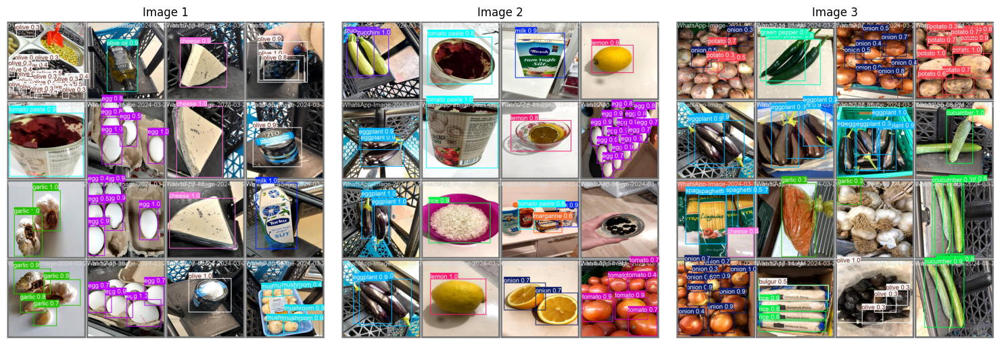

In [12]:
folder = 'runs/detect/val2'
image_files = ['val_batch0_pred.jpg', 'val_batch1_pred.jpg', 'val_batch2_pred.jpg']

fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

for idx, image_file in enumerate(image_files):
    img_path = os.path.join(folder, image_file)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(image)
    axes[idx].set_title(f"Image {idx+1}", fontsize=12)
    axes[idx].axis("off")

plt.tight_layout()
plt.show()


## Predicting on the test dataset

In [13]:
model.predict(source="Dataset/FOOD_INGREDIENTS_DETECTION36/test/images", save=True)


image 1/190 /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/test/images/01cd9cb1c2dcbc5e5060547d412f451f088f9e06_jpg.rf.ba7abe0a3c5fe24a906ca8693865efe3.jpg: 640x640 23 olives, 3.9ms
image 2/190 /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/test/images/0dc3492a4dd29abdfc66bd9671626f0e343d5ff2_jpg.rf.a8ca1e3287f0bc7d0556b67ae0afca02.jpg: 640x640 5 green peppers, 3.9ms
image 3/190 /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/test/images/1aed634f409fe04d64d41789e7fee15af197b6ae_jpg.rf.a576ec0801e026d61c39f760c9ac2260.jpg: 640x640 10 eggs, 3.9ms
image 4/190 /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETECTION36/test/images/21be68b7f10dfb1b35f71c7ad628e104ff30e2c4_jpg.rf.1edc49e9b876099cdf8527d08fe78ac2.jpg: 640x640 4 green peppers, 3.9ms
image 5/190 /home/dnarsipu/Documents/Personal/EE5841-ML/Project/Dataset/FOOD_INGREDIENTS_DETE

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'banana', 1: 'bell pepper', 2: 'bulgur', 3: 'cabbage', 4: 'carrot', 5: 'cheese', 6: 'chicken', 7: 'chickpeas', 8: 'cucumber', 9: 'egg', 10: 'eggplant', 11: 'farfalle pasta', 12: 'fusilli pasta', 13: 'garlic', 14: 'green pepper', 15: 'ground meat', 16: 'ketchup', 17: 'lemon', 18: 'margarine', 19: 'mayonnaise', 20: 'milk', 21: 'mushroom', 22: 'olive', 23: 'olive oil', 24: 'onion', 25: 'parsley', 26: 'potato', 27: 'red lentils', 28: 'rice', 29: 'sausage', 30: 'spaghetti', 31: 'tomato', 32: 'tomato paste', 33: 'turkish dumplings', 34: 'yogurt', 35: 'zucchini'}
 obb: None
 orig_img: array([[[103, 114, 136],
         [ 72,  83, 105],
         [ 80,  87, 107],
         ...,
         [106, 116, 123],
         [107, 117, 124],
         [107, 117, 124]],
 
        [[129, 138, 158],
         [ 82,  91, 111],
         [ 80,  87, 107],
         ...,

## Qualitative Results
Bounding boxes and ingredient class IDs are accurately overlaid. Most ingredients are successfully localized and labeled even under varying illumination, occlusion, and partial views.

Here’s a sample of predictions using the final model on the test images:

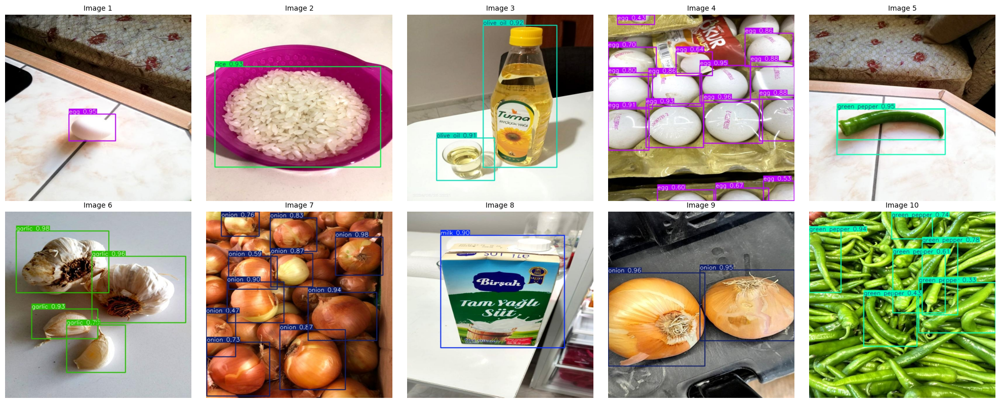

In [14]:
pred_folder = 'runs/detect/predict/'

image_extensions = ('.jpg', '.jpeg', '.png', '.bmp')
image_files = [f for f in os.listdir(pred_folder) if f.lower().endswith(image_extensions)]

#  Randomly select 10 images
selected_images = random.sample(image_files, 10)
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()


for idx, image_name in enumerate(selected_images):
    img_path = os.path.join(pred_folder, image_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(image)
    axes[idx].set_title(f"Image {idx+1}", fontsize=10)
    axes[idx].axis("off")
for i in range(len(selected_images), len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()


## 🍽️ Recipe Recommendation System (TF-IDF) and Recipe Generation with T5 Transformer
Recommends recipes based on cosine similarity between detected ingredients and a recipe database. We generate a natural language recipe using a pre-trained T5 model based on detected ingredients.



In [15]:
# Ingredient list
ingredient_names = [
    "Banana", "Bell pepper", "Bulgur", "Cabbage", "Carrot", "Cheese", "Chicken",
    "Chickpeas", "Cucumber", "Egg", "Eggplant", "Farfalle pasta", "Fusilli pasta",
    "Garlic", "Green pepper", "Ground meat", "Ketchup", "Lemon", "Margarine",
    "Mayonnaise", "Milk", "Mushroom", "Olive", "Olive oil", "Onion", "Parsley",
    "Potato", "Red lentils", "Rice", "Sausage", "Spaghetti", "Tomato",
    "Tomato paste", "Turkish dumplings", "Yogurt", "Zucchini"
]

# Enriched recipe dataset
recipes_data = [
    {"title": "Tomato Pasta", "ingredients": ["Tomato", "Spaghetti", "Garlic", "Olive oil"], "vegetarian": True, "gluten_free": False, "calories": 450},
    {"title": "Veggie Stir Fry", "ingredients": ["Carrot", "Bell pepper", "Cabbage", "Onion"], "vegetarian": True, "gluten_free": True, "calories": 320},
    {"title": "Chicken Curry", "ingredients": ["Chicken", "Onion", "Garlic", "Tomato", "Yogurt"], "vegetarian": False, "gluten_free": True, "calories": 550},
    {"title": "Lemon Rice", "ingredients": ["Rice", "Lemon", "Cucumber"], "vegetarian": True, "gluten_free": True, "calories": 300},
    {"title": "Eggplant Parmesan", "ingredients": ["Eggplant", "Cheese", "Tomato paste", "Garlic"], "vegetarian": True, "gluten_free": False, "calories": 400},
    {"title": "Potato Salad", "ingredients": ["Potato", "Mayonnaise", "Onion"], "vegetarian": True, "gluten_free": True, "calories": 350},
    {"title": "Zucchini Noodles", "ingredients": ["Zucchini", "Garlic", "Olive oil"], "vegetarian": True, "gluten_free": True, "calories": 280},
    {"title": "Red Lentil Soup", "ingredients": ["Red lentils", "Carrot", "Onion", "Parsley"], "vegetarian": True, "gluten_free": True, "calories": 310},
    {"title": "Egg Fried Rice", "ingredients": ["Egg", "Rice", "Green pepper", "Ketchup"], "vegetarian": True, "gluten_free": True, "calories": 420},
    {"title": "Mushroom Omelette", "ingredients": ["Egg", "Mushroom", "Cheese"], "vegetarian": True, "gluten_free": True, "calories": 380}
]
recipes_df = pd.DataFrame(recipes_data)
recipes_df["ingredient_text"] = recipes_df["ingredients"].apply(lambda x: " ".join(x))

# TF-IDF setup
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(recipes_df["ingredient_text"])

# Log data
log_data = []

# Recommender function
def recommend_recipes(detected_ingredients, preference="None", top_k=3):
    query = " ".join(detected_ingredients)
    query_vec = vectorizer.transform([query])
    similarity_scores = cosine_similarity(query_vec, tfidf_matrix).flatten()
    recipes_df["score"] = similarity_scores

    if preference == "Vegetarian":
        filtered = recipes_df[recipes_df["vegetarian"]]
    elif preference == "Gluten-Free":
        filtered = recipes_df[recipes_df["gluten_free"]]
    else:
        filtered = recipes_df

    top = filtered.sort_values("score", ascending=False).head(top_k)
    return top[["title", "ingredients", "calories"]].reset_index(drop=True)


# Global for session ingredient accumulation
session_ingredients = set()

# Load T5 model and tokenizer
tokenizer = AutoTokenizer.from_pretrained("flax-community/t5-recipe-generation")
t5_model = AutoModelForSeq2SeqLM.from_pretrained("flax-community/t5-recipe-generation")


# Detection + Recommendation
def detect_and_recommend(image, preference, manual_add, manual_remove):
    global session_ingredients

    results = model(image)[0]
    detected = set(model.names[int(box.cls[0])] for box in results.boxes)
    session_ingredients = detected.union(session_ingredients)

    if manual_add:
        session_ingredients.add(manual_add)
    if manual_remove and manual_remove in session_ingredients:
        session_ingredients.remove(manual_remove)

    annotated = results.plot()
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    final_detected_set = list(session_ingredients)

    # TF-IDF recommendations
    recommendations = recommend_recipes(final_detected_set, preference=preference)
    log_data.append({"ingredients": final_detected_set, "recommendations": recommendations.to_dict(orient="records")})

    tfidf_text = "\n".join(
        f"{i+1}. {row['title']} (Calories: {row['calories']}) - {', '.join(row['ingredients'])}"
        for i, row in recommendations.iterrows()
    )

    # T5 Recipe Generation
    input_text = "Ingredients: " + ", ".join(final_detected_set) + "."
    input_ids = tokenizer.encode(input_text, return_tensors="pt")
    output = t5_model.generate(input_ids, max_length=512)
    generated_recipe = tokenizer.decode(output[0], skip_special_tokens=True)

    # Save to CSV
    detected_str = ", ".join(final_detected_set)
    rec_export = recommendations.to_csv(index=False)
    with open("detected_and_recommended.csv", "w") as f:
        f.write(f"Detected Ingredients:\n{detected_str}\n\n")
        f.write("TF-IDF Recommended Recipes:\n")
        f.write(rec_export)
        f.write("\n\nT5 Generated Recipe:\n")
        f.write(generated_recipe)

    return annotated, detected_str, tfidf_text, generated_recipe, "detected_and_recommended.csv"



## 🖥️ Gradio Interface
Live demo that integrates YOLO detection + TF-IDF recommender + T5 generator + CSV download.

In [16]:
## Click on the public URL to open it in the browser

gr.Interface(
    fn=detect_and_recommend,
    inputs=[
        gr.Image(source="webcam", type="numpy", label="📷 Live Camera"),
        gr.Radio(["None", "Vegetarian", "Gluten-Free"], label="User Preference"),
        gr.Dropdown(choices=ingredient_names, label="Add Ingredient", interactive=True),
        gr.Dropdown(choices=ingredient_names, label="Remove Ingredient", interactive=True)
    ],
    outputs=[
        gr.Image(label="🔍 Detected Image"),
        gr.Textbox(label="🍽️ Detected Ingredients"),
        gr.Textbox(label="📖 TF-IDF Recipe Recommendations"),
        gr.Textbox(label="🤖 T5 Generated Recipe"),
        gr.File(label="⬇️ Download CSV")


    ],
    live=True,
    title="🥗 YOLOv8 Real-Time Ingredient Detector + Recipe Recommender",
    description="Detect ingredients live with your webcam, add/remove manually, filter by diet, and download recommendations."
).launch(share=True)


Running on local URL:  http://127.0.0.1:7860
IMPORTANT: You are using gradio version 3.50.2, however version 4.44.1 is available, please upgrade.
--------
Running on public URL: https://ae5a19d5e9935ecd53.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


## Results and Final Plots

### Training

During training, the YOLOv8 model achieved a validation mAP@0.5 of 0.799. These performance metrics are further supported by evaluation plots such as the confusion matrix, confidence-F1 curve, and the precision-recall curve. The results indicate the model generalizes well to unseen data, achieving high precision and recall across most ingredient classes.

### Confusion Matrix

<p float="left">
  <img src="runs/detect/val2/confusion_matrix_normalized.png"  alt="Confusion Matrix Normalized" width="300" />
  <img src="runs/detect/val2/confusion_matrix.png"  alt="Confusion Matrix" width="300" />
</p>


- The Figures above shows the confusion matrix (normalized and raw) for all 33 classes. The model performs well on most classes with high per-class accuracy. Misclassifications mostly occurred between visually similar classes such as olive vs olive oil, and milk vs mayonnaise.

### F1-Confidence Curve

<img src="runs/detect/val2/F1_curve.png" alt="F1 Curve" width="500"/>

- Figure above presents the F1-confidence curve, which peaks at an F1-score of 0.68 when the model's confidence threshold is set to 0.734. This threshold can be useful for filtering low-confidence predictions to improve reliability in downstream tasks.

### Precision-Confidence Curve

<img src="runs/detect/val2/P_curve.png" alt="Precision - Confidence Curve" width="500"/>

- Precision-confidence analysis (Figure above) indicates that the model achieves perfect precision at high confidence thresholds. This suggests that confident predictions are highly reliable, though potentially at the cost of recall.

### Recall-Confidence Curve

<img src="runs/detect/val2/PR_curve.png" alt="Recall - Confidence Curve" width="500"/>

- The mAP@0.5 across all classes is 0.829 (Figure above), suggesting strong detection performance. This value reflects the average precision over all classes when predictions are considered correct at an IoU threshold of 0.5.

### Precision-Recall Curve (mAP@0.5)

<img src="runs/detect/val2/R_curve.png" alt="Precision - Recall Curve" width="500"/>

- As shown in the recall-confidence plot, recall decreases with increasing confidence, consistent with a typical precision-recall tradeoff. The model achieves a maximum recall of 0.97 at a confidence threshold of 0.



<!-- <img src="/home/dnarsipu/Documents/Personal/EE5841-ML/Project/runs/detect/val4/F1_curve.png" alt="F1 Curve" width="500"/>

<p float="left">
  <img src="/home/dnarsipu/Documents/Personal/EE5841-ML/Project/runs/detect/val4/F1_curve.png" alt="F1 Curve" width="300" />
  <img src="/home/dnarsipu/Documents/Personal/EE5841-ML/Project/runs/detect/val4/R_curve.png" alt="R Curve" width="300" />
</p> -->